## PLEASE READ: DATA DOWNLOAD

Before running this notebook, ensure the 'modelling.ipynb' notebook has been run. 

Ensure that the 'VIC Localities Shape File' folder from the Google Drive has been downloaded into the '/data/map' directory.

----

### Import Libraries and Data

In [3]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
import folium
import branca.colormap as branca_cm
from folium.features import GeoJsonTooltip
import matplotlib.cm as mpl_cm
import os
import numpy as np

In [4]:
# Rental Price Predictions Data 
one_bed_flat_pred = pd.read_csv('../data/curated/predictions/one_bed_flat_predictions.csv')
two_bed_flat_pred = pd.read_csv('../data/curated/predictions/two_bed_flat_predictions.csv')
three_bed_flat_pred = pd.read_csv('../data/curated/predictions/three_bed_flat_predictions.csv')
two_bed_house_pred = pd.read_csv('../data/curated/predictions/two_bed_house_predictions.csv')
three_bed_house_pred = pd.read_csv('../data/curated/predictions/three_bed_house_predictions.csv')
four_bed_house_pred = pd.read_csv('../data/curated/predictions/four_bed_house_predictions.csv')
all_properties_pred = pd.read_csv('../data/curated/predictions/all_properties_predictions.csv')

# Merged Data
one_bed_flat_merged = pd.read_csv('../data/curated/merged_feature_set/one_bed_flat_merged.csv')
two_bed_flat_merged = pd.read_csv('../data/curated/merged_feature_set/two_bed_flat_merged.csv')
three_bed_flat_merged = pd.read_csv('../data/curated/merged_feature_set/three_bed_flat_merged.csv')
two_bed_house_merged = pd.read_csv('../data/curated/merged_feature_set/two_bed_house_merged.csv')
three_bed_house_merged = pd.read_csv('../data/curated/merged_feature_set/three_bed_house_merged.csv')
four_bed_house_merged = pd.read_csv('../data/curated/merged_feature_set/four_bed_house_merged.csv')
all_properties_merged = pd.read_csv('../data/curated/merged_feature_set/all_properties_merged.csv')

# MAE
mae = pd.read_csv('../data/curated/predictions/mae.csv')

# Load Victoria suburbs shapefile for filtering
vic_suburbs_gdf = gpd.read_file('../data/map/VIC Localities Shape File/gda2020_vicgrid/esrishape/whole_of_dataset/victoria/VMADMIN/LOCALITY_POLYGON.shp')
vic_suburbs_gdf = vic_suburbs_gdf.to_crs(epsg=4326)
vic_suburbs_gdf['suburb'] = vic_suburbs_gdf['GAZLOC'].str.lower()

### Calculate Growth Rate 

In [5]:
# List of columns to keep
columns_to_keep = ['suburb', 'year', 'dec_median', 'mar_median']

# Append rows only if suburbs match, keeping only specified columns
one_bed_flat_2024 = one_bed_flat_merged[(one_bed_flat_merged['year'] == 2024) & 
                                        (one_bed_flat_merged['suburb'].isin(one_bed_flat_pred['suburb']))][columns_to_keep]
two_bed_flat_2024 = two_bed_flat_merged[(two_bed_flat_merged['year'] == 2024) & 
                                        (two_bed_flat_merged['suburb'].isin(two_bed_flat_pred['suburb']))][columns_to_keep]
three_bed_flat_2024 = three_bed_flat_merged[(three_bed_flat_merged['year'] == 2024) & 
                                            (three_bed_flat_merged['suburb'].isin(three_bed_flat_pred['suburb']))][columns_to_keep]
two_bed_house_2024 = two_bed_house_merged[(two_bed_house_merged['year'] == 2024) & 
                                          (two_bed_house_merged['suburb'].isin(two_bed_house_pred['suburb']))][columns_to_keep]
three_bed_house_2024 = three_bed_house_merged[(three_bed_house_merged['year'] == 2024) & 
                                              (three_bed_house_merged['suburb'].isin(three_bed_house_pred['suburb']))][columns_to_keep]
four_bed_house_2024 = four_bed_house_merged[(four_bed_house_merged['year'] == 2024) & 
                                            (four_bed_house_merged['suburb'].isin(four_bed_house_pred['suburb']))][columns_to_keep]
all_properties_2024 = all_properties_merged[(all_properties_merged['year'] == 2024) & 
                                            (all_properties_merged['suburb'].isin(all_properties_pred['suburb']))][columns_to_keep]

# Append matching rows to their respective prediction dataframes (gr = growth rate)
# This creates a dataframe that containes the median rent for the years of 2024-2027
one_bed_flat_gr = pd.concat([one_bed_flat_pred, one_bed_flat_2024], ignore_index=True)[columns_to_keep]
two_bed_flat_gr = pd.concat([two_bed_flat_pred, two_bed_flat_2024], ignore_index=True)[columns_to_keep]
three_bed_flat_gr = pd.concat([three_bed_flat_pred, three_bed_flat_2024], ignore_index=True)[columns_to_keep]
two_bed_house_gr = pd.concat([two_bed_house_pred, two_bed_house_2024], ignore_index=True)[columns_to_keep]
three_bed_house_gr = pd.concat([three_bed_house_pred, three_bed_house_2024], ignore_index=True)[columns_to_keep]
four_bed_house_gr = pd.concat([four_bed_house_pred, four_bed_house_2024], ignore_index=True)[columns_to_keep]
all_properties_gr = pd.concat([all_properties_pred, all_properties_2024], ignore_index=True)[columns_to_keep]

In [6]:
def calculate_growth_rate(df, vic_suburbs_gdf):
    """
    This function calculates the growth rate between 2024 and 2027. It then 
    outputs a dataframe containing the suburb, corresponding calculated growth rate 
    and suburb geometry for mapping. 
    """
    # Filter for 2024 and 2027 data
    df_2024 = df[df['year'] == 2024][['suburb', 'mar_median']]
    df_2027 = df[df['year'] == 2027][['suburb', 'dec_median']]
    
    # Merge the 2024 and 2027 data on 'suburb' to compare growth
    growth_df = pd.merge(df_2024, df_2027, on='suburb', how='inner')
    
    # Calculate growth rate
    growth_df['growth_rate'] = (growth_df['dec_median'] - growth_df['mar_median']) / growth_df['mar_median'] * 100

    # Add geometry column for plotting 
    growth_df = pd.merge(growth_df, vic_suburbs_gdf[['suburb', 'geometry']], on='suburb', how='inner')

    return growth_df[['suburb', 'growth_rate', 'geometry']]

# Applying to each dataframe
one_bed_flat_gr = calculate_growth_rate(one_bed_flat_gr, vic_suburbs_gdf)
two_bed_flat_gr = calculate_growth_rate(two_bed_flat_gr, vic_suburbs_gdf)
three_bed_flat_gr = calculate_growth_rate(three_bed_flat_gr, vic_suburbs_gdf)
two_bed_house_gr = calculate_growth_rate(two_bed_house_gr, vic_suburbs_gdf)
three_bed_house_gr = calculate_growth_rate(three_bed_house_gr, vic_suburbs_gdf)
four_bed_house_gr = calculate_growth_rate(four_bed_house_gr, vic_suburbs_gdf)
all_properties_gr = calculate_growth_rate(all_properties_gr, vic_suburbs_gdf)

#### Growth Rate Visualisation

In [7]:
# Assuming your dataframe is already a GeoDataFrame
gdf = gpd.GeoDataFrame(all_properties_gr, geometry='geometry')

# Reproject to WGS84 (lat/long format) for folium compatibility
gdf = gdf.to_crs(epsg=4326)

# Create a folium map centered around the coordinates of the data
m = folium.Map(location=[-37.8136, 144.9631], zoom_start=10)

# Create a colormap (green for positive, red for negative)
colormap = branca_cm.LinearColormap(colors=['red', 'yellow', 'green'], vmin=gdf['growth_rate'].min(), vmax=gdf['growth_rate'].max())
colormap.caption = 'Growth Rate (%)'

# Add polygons to the map with the proper color
folium.GeoJson(
    gdf,
    style_function=lambda feature: {
        'fillColor': colormap(feature['properties']['growth_rate']),
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.7,
    },
    tooltip=GeoJsonTooltip(
        fields=['suburb', 'growth_rate'],
        aliases=['Suburb: ', 'Growth Rate: '],
        localize=True
    )
).add_to(m)

# Add the colormap to the map
colormap.add_to(m)

# Display the map
m.save('../plots/model_visualisations/growth_rate.html')

m  # This will display the map in a Jupyter environment or you can open the saved HTML


#### Positive Growth Rate & negative Growth Rate Maps

In [8]:
# Split the GeoDataFrame into positive and negative growth rates
gdf_positive = gdf[gdf['growth_rate'] > 0]
gdf_negative = gdf[gdf['growth_rate'] < 0]

# Create the folium map for positive growth rates
m_positive = folium.Map(location=[-37.8136, 144.9631], zoom_start=10)

# Create colormap for positive growth rates
colormap_positive = branca_cm.LinearColormap(colors=['yellow', 'green'], vmin=gdf_positive['growth_rate'].min(), vmax=gdf_positive['growth_rate'].max())
colormap_positive.caption = 'Positive Growth Rate (%)'

# Add polygons for positive growth rates
folium.GeoJson(
    gdf_positive,
    style_function=lambda feature: {
        'fillColor': colormap_positive(feature['properties']['growth_rate']),
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.7,
    },
    tooltip=GeoJsonTooltip(
        fields=['suburb', 'growth_rate'],
        aliases=['Suburb: ', 'Growth Rate: '],
        localize=True
    )
).add_to(m_positive)

# Add the colormap for positive growth rates
colormap_positive.add_to(m_positive)

# Save and display the map for positive growth rates
m_positive.save('../plots/model_visualisations/growth_rate_positive.html')

m_positive

In [9]:
# Create the folium map for negative growth rates
m_negative = folium.Map(location=[-37.8136, 144.9631], zoom_start=10)

# Create colormap for negative growth rates
colormap_negative = branca_cm.LinearColormap(colors=['red', 'yellow'], vmin=gdf_negative['growth_rate'].min(), vmax=gdf_negative['growth_rate'].max())
colormap_negative.caption = 'Negative Growth Rate (%)'

# Add polygons for negative growth rates
folium.GeoJson(
    gdf_negative,
    style_function=lambda feature: {
        'fillColor': colormap_negative(feature['properties']['growth_rate']),
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.7,
    },
    tooltip=GeoJsonTooltip(
        fields=['suburb', 'growth_rate'],
        aliases=['Suburb: ', 'Growth Rate: '],
        localize=True
    )
).add_to(m_negative)

# Add the colormap for negative growth rates
colormap_negative.add_to(m_negative)

# Save and display the map for negative growth rates
m_negative.save('../plots/model_visualisations/growth_rate_negative.html')
m_negative

#### Stats for Growth Rate

In [10]:
top_10_highest_growth = all_properties_gr.sort_values(by='growth_rate', ascending=False).head(11)
top_10_lowest_growth = all_properties_gr.sort_values(by='growth_rate', ascending=True).head(10)
print(top_10_lowest_growth)
print(top_10_highest_growth)

             suburb  growth_rate  \
196         wodonga   -20.491191   
192  west melbourne   -18.386618   
165      sebastopol   -18.105514   
33          burwood   -17.148672   
59        docklands   -16.019753   
79      forest hill   -15.389999   
12           balwyn   -13.669246   
30          bulleen   -12.834466   
60        doncaster   -12.698853   
105          keilor   -12.557644   

                                              geometry  
196  POLYGON ((146.88878 -36.15021, 146.88828 -36.1...  
192  POLYGON ((144.92167 -37.81885, 144.92124 -37.8...  
165  POLYGON ((143.84531 -37.61123, 143.84519 -37.6...  
33   POLYGON ((145.11367 -37.85743, 145.11349 -37.8...  
59   POLYGON ((144.94841 -37.82405, 144.94841 -37.8...  
79   POLYGON ((145.15911 -37.84117, 145.15926 -37.8...  
12   POLYGON ((145.07087 -37.81672, 145.07066 -37.8...  
30   POLYGON ((145.0788 -37.77695, 145.07856 -37.77...  
60   POLYGON ((145.10289 -37.78753, 145.10225 -37.7...  
105  POLYGON ((144.83836 -37.7098

---

### RENT VISION PRO TOOL - Predictions & Error Visualisation

In [11]:
# List of columns to keep
columns_to_keep = ['suburb', 'year', 'mar_median', 'jun_median', 'sep_median', 'dec_median']

# Append rows only if suburbs match, keeping only specified columns
one_bed_flat_2024 = one_bed_flat_merged[(one_bed_flat_merged['year'] > 2021) & 
                                        (one_bed_flat_merged['year'] < 2025) & 
                                        (one_bed_flat_merged['suburb'].isin(one_bed_flat_pred['suburb']))][columns_to_keep]
two_bed_flat_2024 = two_bed_flat_merged[(two_bed_flat_merged['year'] > 2021) & 
                                        (two_bed_flat_merged['year'] < 2025) & 
                                        (two_bed_flat_merged['suburb'].isin(two_bed_flat_pred['suburb']))][columns_to_keep]
three_bed_flat_2024 = three_bed_flat_merged[(three_bed_flat_merged['year'] > 2021) & 
                                            (three_bed_flat_merged['year'] < 2025) & 
                                            (three_bed_flat_merged['suburb'].isin(three_bed_flat_pred['suburb']))][columns_to_keep]
two_bed_house_2024 = two_bed_house_merged[(two_bed_house_merged['year'] > 2021) & 
                                          (two_bed_house_merged['year'] < 2025) & 
                                          (two_bed_house_merged['suburb'].isin(two_bed_house_pred['suburb']))][columns_to_keep]
three_bed_house_2024 = three_bed_house_merged[(three_bed_house_merged['year'] > 2021) & 
                                              (three_bed_house_merged['year'] < 2025) & 
                                              (three_bed_house_merged['suburb'].isin(three_bed_house_pred['suburb']))][columns_to_keep]
four_bed_house_2024 = four_bed_house_merged[(four_bed_house_merged['year'] > 2021) & 
                                            (four_bed_house_merged['year'] < 2025) & 
                                            (four_bed_house_merged['suburb'].isin(four_bed_house_pred['suburb']))][columns_to_keep]
all_properties_2024 = all_properties_merged[(all_properties_merged['year'] > 2021) &
                                            (all_properties_merged['year'] < 2025) & 
                                            (all_properties_merged['suburb'].isin(all_properties_pred['suburb']))][columns_to_keep]

# Append matching rows to their respective prediction dataframes
# Dataframes store median rental prices from 2022 - 2027
one_bed_flat_error = pd.concat([one_bed_flat_pred, one_bed_flat_2024], ignore_index=True)
two_bed_flat_error = pd.concat([two_bed_flat_pred, two_bed_flat_2024], ignore_index=True)
three_bed_flat_error = pd.concat([three_bed_flat_pred, three_bed_flat_2024], ignore_index=True)
two_bed_house_error = pd.concat([two_bed_house_pred, two_bed_house_2024], ignore_index=True)
three_bed_house_error = pd.concat([three_bed_house_pred, three_bed_house_2024], ignore_index=True)
four_bed_house_error = pd.concat([four_bed_house_pred, four_bed_house_2024], ignore_index=True)
all_properties_error = pd.concat([all_properties_pred, all_properties_2024], ignore_index=True)

In [12]:
# Find common suburbs 
# PLEASE NOTE, ONLY SUBURBS FROM THIS OUTPUT CAN SHOW VISUALISATIONS FOR ALL 6 PROPERTY TYPES
common_suburbs = set(one_bed_flat_error['suburb']) & \
                 set(two_bed_flat_error['suburb']) & \
                 set(three_bed_flat_error['suburb']) & \
                 set(two_bed_house_error['suburb']) & \
                 set(three_bed_house_error['suburb']) & \
                 set(four_bed_house_error['suburb']) & \
                 set(all_properties_error['suburb'])

# Print the common suburbs
print("Common suburbs across all dataframes:", common_suburbs)

Common suburbs across all dataframes: {'newtown', 'williamstown', 'malvern east', 'carlton', 'ringwood', 'frankston', 'dandenong', 'murrumbeena', 'shepparton', 'chadstone', 'kensington', 'northcote', 'abbotsford', 'werribee', 'sale', 'malvern', 'thomastown', 'croydon', 'noble park', 'boronia', 'reservoir', 'glenroy', 'windsor', 'epping', 'hawthorn east', 'brunswick', 'richmond', 'coburg', 'pascoe vale', 'elwood', 'doncaster east', 'mount waverley', 'prahran', 'elsternwick', 'altona', 'hawthorn', 'glen waverley', 'north melbourne', 'sunshine', 'mitcham', 'brighton', 'south yarra', 'thornbury', 'broadmeadows', 'essendon', 'pakenham', 'box hill', 'belmont', 'carnegie', 'springvale', 'armadale', 'alphington', 'toorak', 'ascot vale', 'cheltenham', 'balwyn', 'hoppers crossing', 'heidelberg', 'clayton', 'bundoora', 'camberwell', 'brunswick west', 'doncaster', 'geelong', 'carrum downs', 'kew', 'fitzroy', 'footscray', 'mildura', 'traralgon', 'port melbourne', 'preston', 'ferntree gully', 'horsh

In [13]:
def rent_vision_pro(dataframes, suburbs, mae, mae_value_index, title_suffixes):
    """
    Plots and saves the rental prices for flats and houses separately for a given suburb from multiple dataframes,
    with a shaded area representing MAE for each property type.

    Parameters:
    - dataframes: List of dataframes containing the rental prices for different property types
    - suburbs: List of suburb names 
    - mae: The MAE values
    - mae_value_index: The index to extract the MAE value from for each dataframe
    - title_suffixes: Suffixes for the plot titles in terms of property types
    """

    # Directory for saving the plots
    output_dir = '../plots/model_visualisations'
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Split the dataframes into flats and houses
    flats_dataframes = dataframes[:3]
    houses_dataframes = dataframes[3:]
    flats_suffixes = title_suffixes[:3]
    houses_suffixes = title_suffixes[3:]

    for suburb in suburbs:
        # Plot and save for flats
        plt.figure(figsize=(10, 6))
        for i, dataframe in enumerate(flats_dataframes):
            filtered_data = dataframe[(dataframe['suburb'] == suburb) & 
                                      (dataframe['year'] >= 2022) & 
                                      (dataframe['year'] <= 2027)]
            median_prices = []
            for year in range(2022, 2028):
                median_prices.extend(filtered_data.loc[filtered_data['year'] == year, 
                                                       ['mar_median', 'jun_median', 'sep_median', 'dec_median']].values.flatten())
            
            mae_value = mae.iloc[i]
            if isinstance(mae_value, pd.Series):
                mae_value = mae_value.item()
            
            upper_bound = np.array(median_prices) + mae_value
            lower_bound = np.array(median_prices) - mae_value
            
            plt.plot(median_prices, marker='o', color=mpl_cm.Blues(np.linspace(0.5, 1, len(flats_dataframes)))[i], label=flats_suffixes[i])
            plt.fill_between(range(len(median_prices)), lower_bound, upper_bound, color=mpl_cm.Blues(np.linspace(0.5, 1, len(flats_dataframes)))[i], alpha=0.2)

        plt.axvline(x=12, color='grey', linestyle='--', linewidth=2)
        plt.xticks(ticks=[0, 4, 8, 12, 16, 20], labels=['2022', '2023', '2024', '2025', '2026', '2027'])
        plt.xlabel('Year')
        plt.ylabel('Median Rental Price ($)')
        plt.title(f'Median Rental Prices for Flats in {suburb.title()} (2022-2027)')
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.tight_layout()
        # Save the plot for flats
        plt.savefig(os.path.join(output_dir, f'rental_predictions_flats_{suburb}.png'), bbox_inches='tight', pad_inches=0.25)
        plt.show()

        # Plot and save for houses
        plt.figure(figsize=(10, 6))
        for i, dataframe in enumerate(houses_dataframes):
            filtered_data = dataframe[(dataframe['suburb'] == suburb) & 
                                      (dataframe['year'] >= 2022) & 
                                      (dataframe['year'] <= 2027)]
            median_prices = []
            for year in range(2022, 2028):
                median_prices.extend(filtered_data.loc[filtered_data['year'] == year, 
                                                       ['mar_median', 'jun_median', 'sep_median', 'dec_median']].values.flatten())

            mae_value = mae.iloc[i+3]  # Adjust index for houses
            if isinstance(mae_value, pd.Series):
                mae_value = mae_value.item()
            
            upper_bound = np.array(median_prices) + mae_value
            lower_bound = np.array(median_prices) - mae_value
            
            plt.plot(median_prices, marker='o', color=mpl_cm.Purples(np.linspace(0.5, 1, len(houses_dataframes)))[i], label=houses_suffixes[i])
            plt.fill_between(range(len(median_prices)), lower_bound, upper_bound, color=mpl_cm.Purples(np.linspace(0.5, 1, len(houses_dataframes)))[i], alpha=0.2)

        plt.axvline(x=12, color='grey', linestyle='--', linewidth=2)
        plt.xticks(ticks=[0, 4, 8, 12, 16, 20], labels=['2022', '2023', '2024', '2025', '2026', '2027'])
        plt.xlabel('Year')
        plt.ylabel('Median Rental Price ($)')
        plt.title(f'Median Rental Prices for Houses in {suburb.title()} (2022-2027)')
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.tight_layout()

        # Save the plot for houses
        plt.savefig(os.path.join(output_dir, f'rental_predictions_houses_{suburb}.png'), bbox_inches='tight', pad_inches=0.25)
        plt.show()

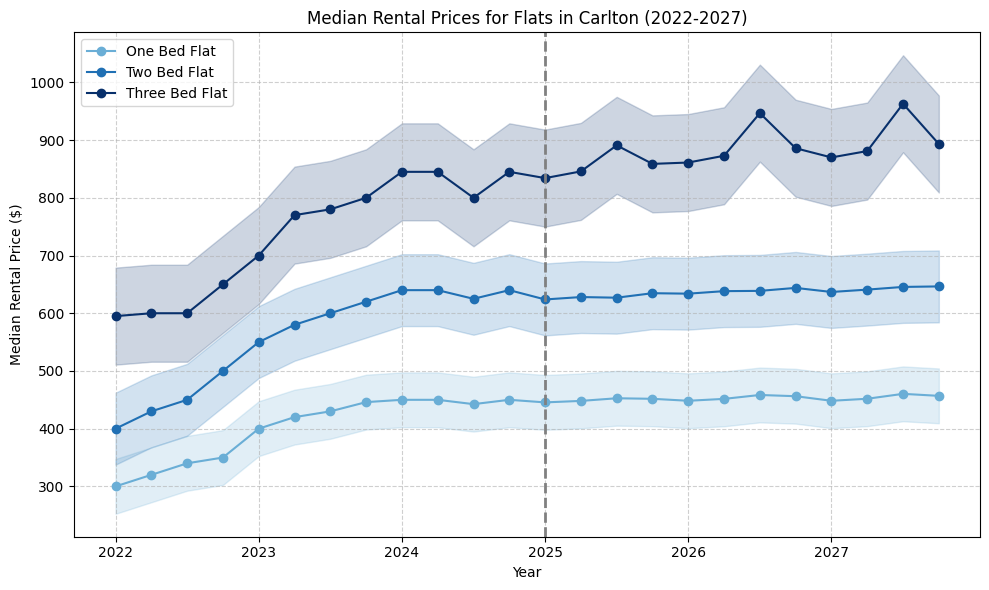

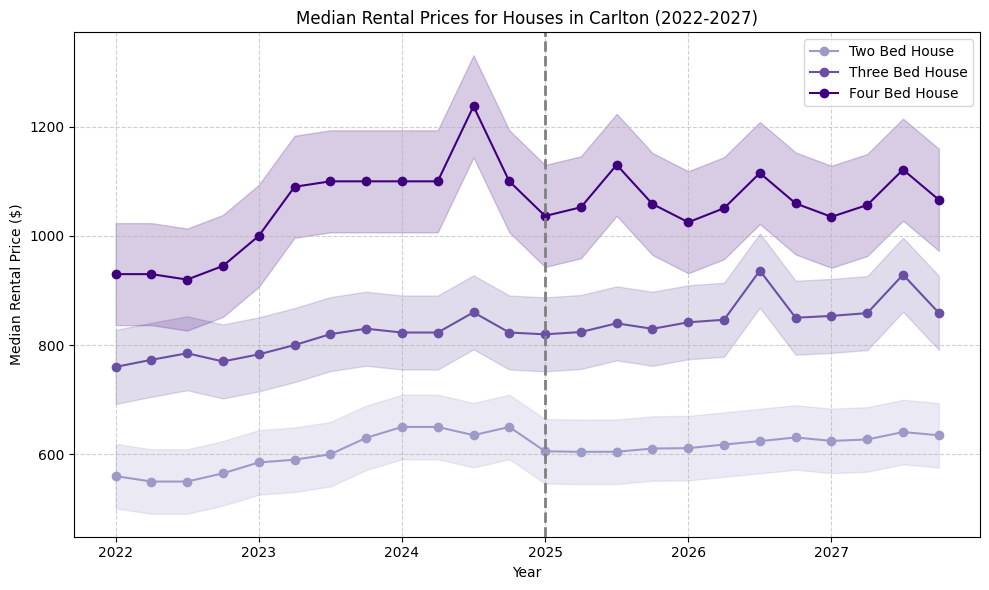

In [14]:
# RENT VISION PRO USAGE

# Use can manually change the property type by removing any unwanted properties
# from dataframes
dataframes = [one_bed_flat_error, two_bed_flat_error, three_bed_flat_error, 
              two_bed_house_error, three_bed_house_error, four_bed_house_error]

# User can manually change the suburb based on which ever suburb in common_suburbs they
# want to inspect
suburbs = ['carlton']

title_suffixes = ['One Bed Flat', 'Two Bed Flat', 'Three Bed Flat', 
                  'Two Bed House', 'Three Bed House', 'Four Bed House']

# Function Call
rent_vision_pro(dataframes, suburbs, mae, mae_value_index=range(7), title_suffixes=title_suffixes)